# Model Training for Quasar Detection

**Goal**: Train, validate, and test machine learning models for Quasar Detection.

We have now loaded the images into the Images folder. We will split our data and train machine learning models to detect Quasars. Once the best validation model is found, we will report its test metrics on a separate test set.

In [1]:
# Useful file management packages
from six.moves import cPickle as pickle
import os
import sys
from scipy import ndimage
# Useful plotting, dataframe, and numerical packages
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import pandas as pd
import random
%matplotlib inline
# Machine learning packages
from sklearn import metrics
from sklearn.model_selection import train_test_split
import tensorflow as tf

# Train, Validation, Test Split

We will first perform a train, validation, and test split of our images at a ratio of 70% of images for training, 15% for validation, and 15% for testing.

In [ ]:
# Remove Quasar Candidates
ImageNames = list(
    filter(lambda name: 'QuasarC' not in name, os.listdir('./Images/')))
NamesData = pd.DataFrame(ImageNames, columns=['FileName'])
NamesData['Quasar'] = NamesData['FileName'].apply(
    lambda name: 'Quasar' in name)

In [ ]:
NamesData.head()

,FileName,Quasar
0,NonQ_0.jpg,False
1,NonQ_1.jpg,False
2,NonQ_10.jpg,False
3,NonQ_100.jpg,False
4,NonQ_1000.jpg,False


In [ ]:
print(NamesData.tail())
print('\n')
print('%s Quasars found.' % NamesData['Quasar'].sum())
# Note 141090 rows is correct as there were 46420 quasars and 94670 non quasars

               FileName Quasar
141085  Quasar_9995.jpg   True
141086  Quasar_9996.jpg   True
141087  Quasar_9997.jpg   True
141088  Quasar_9998.jpg   True
141089  Quasar_9999.jpg   True


46420 Quasars found.


In [ ]:
# Gather training data
X_train, X_rest, y_train, y_rest = train_test_split(
    NamesData['FileName'], NamesData['Quasar'], test_size=0.3)

In [ ]:
X_train.size
# 98763 = 0.7*141090

98763

In [ ]:
# Split validation and testing data
X_valid, X_test, y_valid, y_test = train_test_split(
    X_rest, y_rest, test_size=0.5)

In [ ]:
X_valid.size
# 21163 ~ 0.15*141090

21163

In [ ]:
# Saving our split for future auditing.
train_dataframe = pd.concat([X_train, y_train], axis=1)
train_dataframe.to_csv('train_data.csv', index=False)
valid_dataframe = pd.concat([X_valid, y_valid], axis=1)
valid_dataframe.to_csv('valid_data.csv', index=False)
test_dataframe = pd.concat([X_test, y_test], axis=1)
test_dataframe.to_csv('test_data.csv', index=False)

We now create tensors for our images. These will be useful for tensorflow, and easy to modify for Scikit Learn. The methodology used comes from the <a href="https://www.udacity.com/course/deep-learning--ud730">Deep Learning Udacity Course</a> by Google.

We will reduce the size of the images from 120 pixels by 120 pixels to just a 30 pixel by 30 pixel window due to memory issues.

In [ ]:
def make_image_pickle(ImageNames, PickleName):
    """Covert filenames into an numpy array and pickle it.

    Convert a numpy array of filenames into a numpy array of images 
    preserving the order of the list of filenames given.
    Note, image sizes are expected to be 120 pixels by 120 pixels

    Parameters
    ----------
    ImageNames : A numpy array of image filenames.
    PickleName : Name of the Pickle file to put the images into.
    """
    image_array = np.ndarray(
        shape=(len(ImageNames), 30, 30, 3), dtype=np.float32)
    image_num = 0
    for image in ImageNames:
        if image_num % 1000 == 0:
            print('Loaded image number %s' % str(image_num))
        try:
            image_data = (ndimage.imread(
                './Images/' + image).astype(float) - 255.0 / 2) / 255.0
            if image_data.shape != (120, 120, 3):
                raise Exception('Unexpected image shape: %s' %
                                str(image_data.shape))
            image_array[image_num, :, :, :] = image_data[44:74, 44:74, :]
            image_num = image_num + 1
        except IOError as e:
            print('Could not read:', image, ':', e, ' , skipping.')
            image_num = image_num + 1
    # Pickling the array for faster load times in the future.
    with open(PickleName + '.pickle', 'wb') as file:
        pickle.dump(image_array, file, pickle.HIGHEST_PROTOCOL)

In [ ]:
train_images = make_image_pickle(X_train, 'train_images')

Loaded image number 0
Loaded image number 1000
Loaded image number 2000
Loaded image number 3000
Loaded image number 4000
Loaded image number 5000
Loaded image number 6000
Loaded image number 7000
Loaded image number 8000
Loaded image number 9000
Loaded image number 10000
Loaded image number 11000
Loaded image number 12000
Loaded image number 13000
Loaded image number 14000
Loaded image number 15000
Loaded image number 16000
Loaded image number 17000
Loaded image number 18000
Loaded image number 19000
Loaded image number 20000
Loaded image number 21000
Loaded image number 22000
Loaded image number 23000
Loaded image number 24000
Loaded image number 25000
Loaded image number 26000
Loaded image number 27000
Loaded image number 28000
Loaded image number 29000
Loaded image number 30000
Loaded image number 31000
Loaded image number 32000
Loaded image number 33000
Loaded image number 34000
Loaded image number 35000
Loaded image number 36000
Loaded image number 37000
Loaded image number 38000

In [ ]:
valid_images = make_image_pickle(X_valid, 'valid_images')

Loaded image number 0
Loaded image number 1000
Loaded image number 2000
Loaded image number 3000
Loaded image number 4000
Loaded image number 5000
Loaded image number 6000
Loaded image number 7000
Loaded image number 8000
Loaded image number 9000
Loaded image number 10000
Loaded image number 11000
Loaded image number 12000
Loaded image number 13000
Loaded image number 14000
Loaded image number 15000
Loaded image number 16000
Loaded image number 17000
Loaded image number 18000
Loaded image number 19000
Loaded image number 20000
Loaded image number 21000


In [ ]:
test_images = make_image_pickle(X_test, 'test_images')

Loaded image number 0
Loaded image number 1000
Loaded image number 2000
Loaded image number 3000
Loaded image number 4000
Loaded image number 5000
Loaded image number 6000
Loaded image number 7000
Loaded image number 8000
Loaded image number 9000
Loaded image number 10000
Loaded image number 11000
Loaded image number 12000
Loaded image number 13000
Loaded image number 14000
Loaded image number 15000
Loaded image number 16000
Loaded image number 17000
Loaded image number 18000
Loaded image number 19000
Loaded image number 20000
Loaded image number 21000


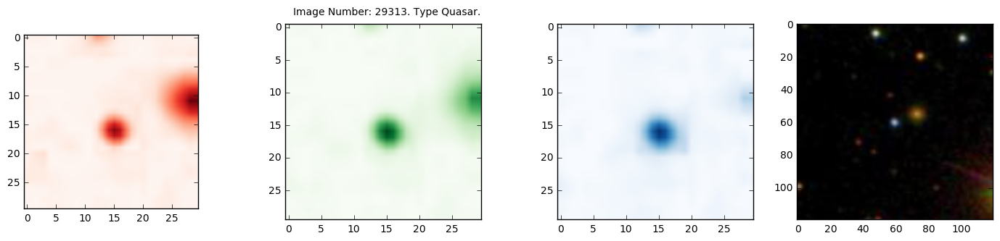

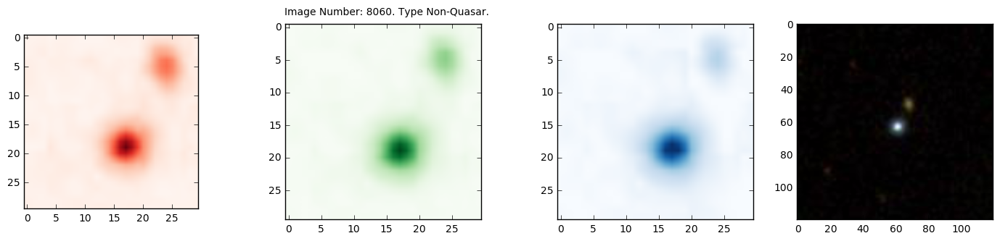

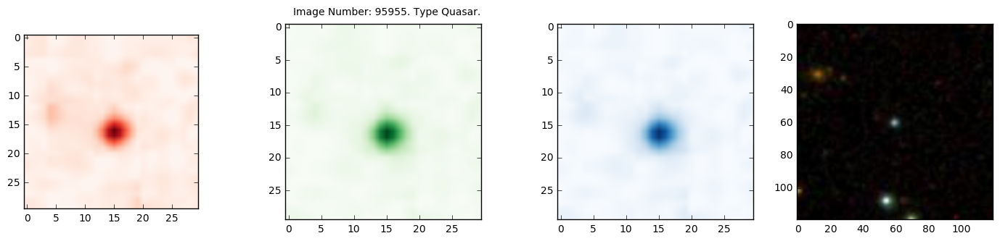

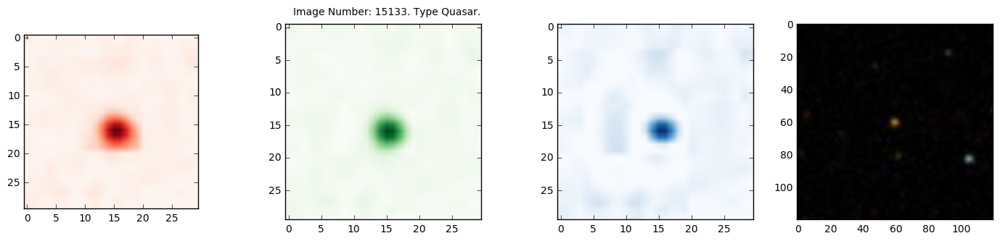

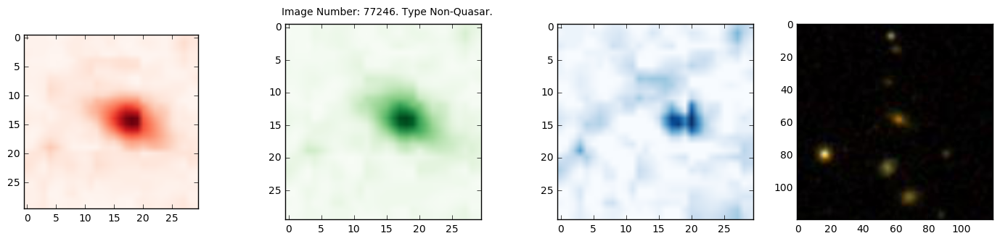

...

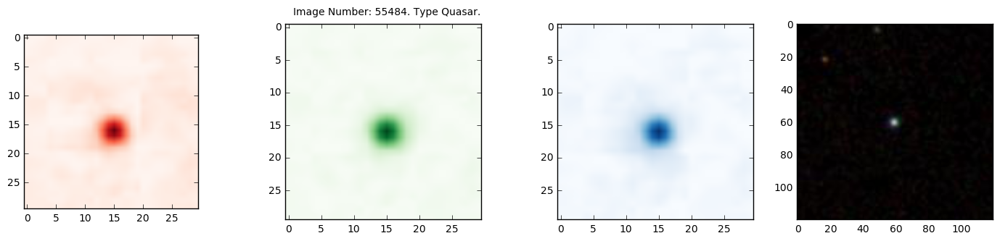

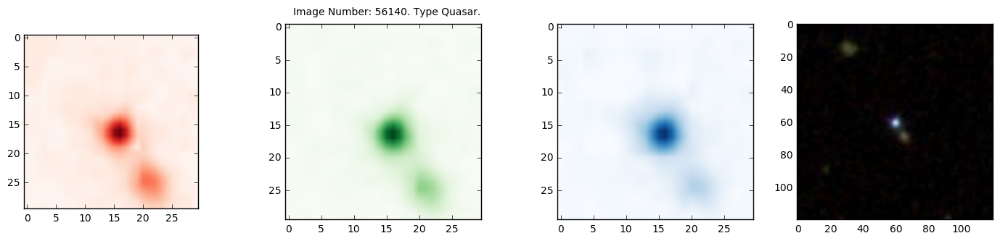

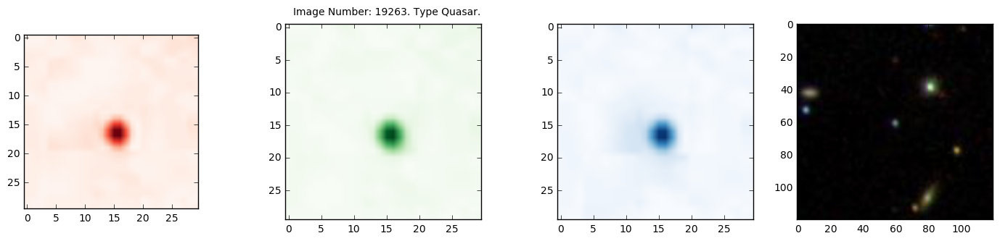

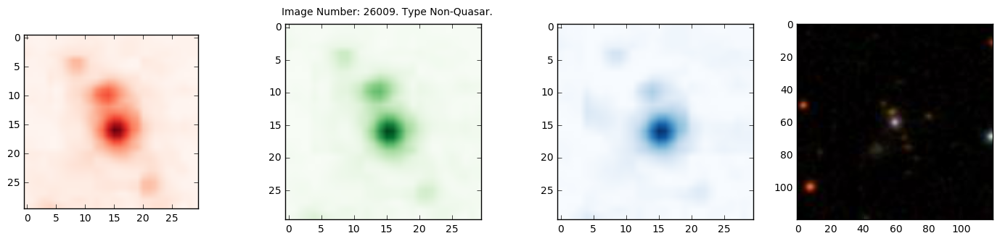

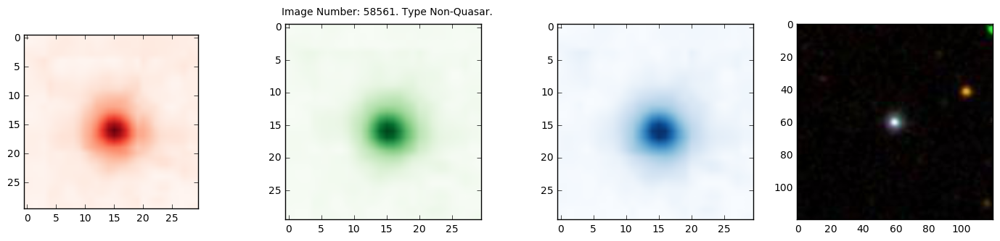

In [ ]:
# Previewing the training images
training_images = pickle.load(open('train_images.pickle', "rb"))
for i in range(20):
    (num_images, imagesize1, imagesize2, imagesize3) = training_images.shape
    rsel = random.randint(0, num_images - 1)
    imageplot = plt.figure(figsize=(10, 3))
    axis1 = imageplot.add_axes([0, 0, .24, .9])
    axis1.imshow(training_images[rsel, :, :, 0], cmap='Reds')
    axis2 = imageplot.add_axes([.25, 0, .49, .9])
    axis2.imshow(training_images[rsel, :, :, 1], cmap='Greens')
    axis3 = imageplot.add_axes([.50, 0, .74, .9])
    axis3.imshow(training_images[rsel, :, :, 2], cmap='Blues')
    axis4 = imageplot.add_axes([.75, 0, .9, .9])
    current_img = train_dataframe.loc[rsel]['FileName']
    axis4.imshow(Image.open('./Images/' + current_img))
    if train_dataframe.loc[rsel]['Quasar'] == True:
        imgname = 'Quasar'
    else:
        imgname = 'Non-Quasar'
    imageplot.suptitle('Image Number: %s. Type %s.' % (str(rsel), imgname))
del training_images

# Random Forests Classifier - Off the Shelf Solution

For the first model, we will use a Random Forests. It is an easy to train off the shelf solution.

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

In [ ]:
# Data Import
training_images = pickle.load(open('train_images.pickle', "rb"))
valid_images = pickle.load(open('valid_images.pickle', "rb"))
test_images = pickle.load(open('test_images.pickle', "rb"))
# Import the split dataframes from here if running this project from this point.
train_dataframe = pd.read_csv('train_data.csv')
valid_dataframe = pd.read_csv('valid_data.csv')
test_dataframe = pd.read_csv('test_data.csv')

In [ ]:
RFModel = RandomForestClassifier(n_estimators=30)

In [ ]:
# Depth Gridsearch - Use Crossvalidation to determine the best parameters
depth_grid = list(range(21))[1:21]
RFSearch = GridSearchCV(RFModel, {'max_depth': depth_grid}, verbose=3)

In [ ]:
RF_train_list = []
for i in range(len(training_images)):
    RF_train_list.append(training_images[i, :, :, :].flatten())
RF_X_train = np.array(RF_train_list)

In [ ]:
RFSearch.fit(RF_X_train, train_dataframe['Quasar'])

Fitting 3 folds for each of 20 candidates, totalling 60 fits
[CV] max_depth=1 .....................................................
[CV] ...................... max_depth=1, score=0.851614, total=   6.6s
[CV] max_depth=1 .....................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    7.0s remaining:    0.0s


[CV] ...................... max_depth=1, score=0.861881, total=   3.9s
[CV] max_depth=1 .....................................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   11.3s remaining:    0.0s


[CV] ...................... max_depth=1, score=0.669512, total=   4.0s
[CV] max_depth=2 .....................................................
[CV] ...................... max_depth=2, score=0.931898, total=   7.0s
[CV] max_depth=2 .....................................................
[CV] ...................... max_depth=2, score=0.929680, total=   6.6s
[CV] max_depth=2 .....................................................
[CV] ...................... max_depth=2, score=0.935482, total=   6.5s
[CV] max_depth=3 .....................................................
[CV] ...................... max_depth=3, score=0.940160, total=   9.2s
[CV] max_depth=3 .....................................................
[CV] ...................... max_depth=3, score=0.937153, total=   9.3s
[CV] max_depth=3 .....................................................
[CV] ...................... max_depth=3, score=0.939704, total=   9.2s
[CV] max_depth=4 .....................................................
[CV] .

[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed: 25.4min finished


GridSearchCV(cv=None, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=30, n_jobs=1, oob_score=False, random_state=None,
            verbose=0, warm_start=False),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring=None, verbose=3)

In [ ]:
RFSearch.best_estimator_  # Has max_depth = 17

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=17, max_features='auto', max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=30, n_jobs=1, oob_score=False, random_state=None,
            verbose=0, warm_start=False)

In [ ]:
RFPredModel = RFSearch.best_estimator_

In [ ]:
# We will get us this model to get a base-line performance on the validation data.
RF_valid_list = []
for i in range(len(valid_images)):
    RF_valid_list.append(valid_images[i, :, :, :].flatten())
RF_X_valid = np.array(RF_valid_list)

In [ ]:
RFPredictions = RFPredModel.predict(RF_X_valid)
RFScore = RFPredModel.score(RF_X_valid, valid_dataframe['Quasar'])

Below is the confusion matrix, precision, recall, and f1-score on the validation set.

In [ ]:
print('Confusion Matrix: (note that False is first row and column)')
print(metrics.confusion_matrix(valid_dataframe['Quasar'], RFPredictions))
print('\n')
print('Classification Report:')
print(metrics.classification_report(valid_dataframe['Quasar'], RFPredictions))
print('\n')
print('Validation score: %.4f' % RFScore)

Confusion Matrix: (note that False is first row and column)
[[13666   574]
 [  311  6612]]


Classification Report:
             precision    recall  f1-score   support

      False       0.98      0.96      0.97     14240
       True       0.92      0.96      0.94      6923

avg / total       0.96      0.96      0.96     21163



Validation score: 0.9582


This is a fantastic performance for an off the shelf method. We will now proceed to the convolutional neural network solution.

# Simple ConvNet

We now use tensorflow to train a simple convolutional network with two convolutional layers. The methodology for this model comes from the <a href="https://www.udacity.com/course/deep-learning--ud730">Deep Learning Udacity Course</a> by Google.

In [ ]:
# Encode the classification labels as a trivial float one-hot encoding.
train_dataframe['EncodedQuasar'] = train_dataframe['Quasar'].apply(
    lambda x: float(x))
valid_dataframe['EncodedQuasar'] = valid_dataframe['Quasar'].apply(
    lambda x: float(x))
test_dataframe['EncodedQuasar'] = test_dataframe['Quasar'].apply(
    lambda x: float(x))
train_dataframe['EncodedNonQuasar'] = train_dataframe['Quasar'].apply(
    lambda x: 1 - float(x))
valid_dataframe['EncodedNonQuasar'] = valid_dataframe['Quasar'].apply(
    lambda x: 1 - float(x))
test_dataframe['EncodedNonQuasar'] = test_dataframe['Quasar'].apply(
    lambda x: 1 - float(x))

In [ ]:
# An accuracy function that rounds the prediction value.
def accuracy(predictions, truevals):
    return np.mean(np.argmax(predictions, 1) == np.argmax(truevals, 1)) * 100.0

In [ ]:
# Parameters for the ConvNet.
batch_size = 32
patch_size = 5
num_hidden = 64
num_channels = 3
num_classes = 2
image_size = 30
pixel_depth = 255.0
# The number of new "channels" from the convolutions. The first convolution will have
# a depth of half of this number floored.
depth = 24
graph = tf.Graph()

# Construction of the ConvNet Architecture
with graph.as_default():
    # Input training batch.
    tf_train_images = tf.placeholder(tf.float32, shape=(
        batch_size, image_size, image_size, num_channels))
    tf_y_train = tf.placeholder(tf.float32, shape=(batch_size, num_classes))

    # Variables for the model.
    # Initialize all matrix weights from a truncated normal distribution.
    # Initialize biases as 0 for the first layer, and 1 there after.
    # Each convolution will use a stride of 2 in both horizontal
    # and vertical directions for each layer.
    layer1_weights = tf.Variable(tf.truncated_normal(
        [patch_size, patch_size, num_channels, depth // 2], stddev=0.1),
        name='layer1_weights')
    layer1_biases = tf.Variable(tf.zeros([depth // 2]), name='layer1_biases')
    layer2_weights = tf.Variable(tf.truncated_normal(
        [patch_size, patch_size, depth // 2, depth], stddev=0.1),
        name='layer2_weights')
    layer2_biases = tf.Variable(tf.constant(
        1.0, shape=[depth]), name='layer2_biases')
    layer3_weights = tf.Variable(tf.truncated_normal(
        [(image_size // 4 + 1) * (image_size // 4 + 1) * depth, num_hidden], stddev=0.1),
        name='layer3_weights')
    layer3_biases = tf.Variable(tf.constant(
        1.0, shape=[num_hidden]), name='layer3_biases')
    layer4_weights = tf.Variable(tf.truncated_normal([num_hidden, num_classes], stddev=0.1),
                                 name='layer4_weights')
    layer4_biases = tf.Variable(tf.constant(
        1.0, shape=[num_classes]), name='layer4_biases')

    # The Convolutional Network Architecture.
    def convnet(data):
        # First convolution
        conv1 = tf.nn.conv2d(data, layer1_weights, [
                             1, 2, 2, 1], padding='SAME', name='conv1')
        # Activation on the first convolution plus biases.
        hidden1 = tf.nn.relu(conv1 + layer1_biases, name='hidden1')
        # Second convolution
        conv2 = tf.nn.conv2d(hidden1, layer2_weights, [
                             1, 2, 2, 1], padding='SAME', name='conv2')
        # Activation on the second convolution plus biases.
        hidden2 = tf.nn.relu(conv2 + layer2_biases, name='hidden2')
        # Flatten the convolutions to a 2D tensor for the fully connected layer.
        reshape = tf.reshape(
            hidden2, [-1, (image_size // 4 + 1) * (image_size // 4 + 1) * depth], name='Reshape')
        # Apply a hidden layer of a fully connected neural network.
        preactivation3 = tf.matmul(
            reshape, layer3_weights, name='preactiviation3')
        # Activation on the hidden fully conected layer.
        hidden3 = tf.nn.relu(preactivation3 + layer3_biases, name='hidden3')
        # Output layer.
        return tf.matmul(hidden3, layer4_weights) + layer4_biases

    # Training logits and loss
    logits = convnet(tf_train_images)
    loss = tf.reduce_mean(
        tf.nn.softmax_cross_entropy_with_logits(labels=tf_y_train, logits=logits))

    # Optimizer: We will use the more powerful but computationally expensive Adam Optimizer.
    optimizer = tf.train.AdamOptimizer(1e-3).minimize(loss)

    # Predictions for the training and validation data.
    train_prediction = tf.nn.softmax(logits)
    valid_prediction = tf.nn.softmax(convnet(valid_images))

In [ ]:
# Reshape the training labels.
training_labels = train_dataframe[['EncodedQuasar', 'EncodedNonQuasar']].values
# Training the ConvNet
num_epochs = 6
num_steps = training_labels.shape[0] // batch_size

with tf.Session(graph=graph) as session:
    tf.global_variables_initializer().run()
    print('Initialized ConvNet')
    for epoch in range(num_epochs):
        print('EPOCH: %d' % epoch)
        for step in range(num_steps):
            offset = (
                step * batch_size) % (training_labels.shape[0] - batch_size)
            batch_data = training_images[offset:(offset + batch_size), :, :, :]
            batch_y = training_labels[offset:(offset + batch_size), :]
            feed_dict = {tf_train_images: batch_data, tf_y_train: batch_y}
            _, l, predictions = session.run(
                [optimizer, loss, train_prediction], feed_dict=feed_dict)
            if (step % 1000 == 0):
                print('Minibatch loss at step %d of epoch %d: %f' %
                      (step, epoch, l))
                print('Minibatch accuracy: %.1f%%' %
                      accuracy(predictions, batch_y))
                print('Validation accuracy: %.1f%%' % accuracy(
                    valid_prediction.eval(), valid_dataframe[['EncodedQuasar', 'EncodedNonQuasar']].values))
        print('Validation accuracy at the END OF EPOCH %d: %.1f%%' % (epoch, accuracy(
            valid_prediction.eval(), valid_dataframe[['EncodedQuasar', 'EncodedNonQuasar']].values)))
    print('Overall Validation accuracy: %.1f%%' % accuracy(
        valid_prediction.eval(), valid_dataframe[['EncodedQuasar', 'EncodedNonQuasar']].values))
    CNPredictions = valid_prediction.eval()

Initialized ConvNet
EPOCH: 0
Minibatch loss at step 0 of epoch 0: 1.825913
Minibatch accuracy: 56.2%
Validation accuracy: 32.7%
Minibatch loss at step 1000 of epoch 0: 0.170189
Minibatch accuracy: 96.9%
Validation accuracy: 94.6%
Minibatch loss at step 2000 of epoch 0: 0.224669
Minibatch accuracy: 90.6%
Validation accuracy: 95.0%
Minibatch loss at step 3000 of epoch 0: 0.023197
Minibatch accuracy: 100.0%
Validation accuracy: 95.3%
Validation accuracy at the END OF EPOCH 0: 95.3%
EPOCH: 1
Minibatch loss at step 0 of epoch 1: 0.245453
Minibatch accuracy: 90.6%
Validation accuracy: 95.3%
Minibatch loss at step 1000 of epoch 1: 0.095027
Minibatch accuracy: 96.9%
Validation accuracy: 95.2%
Minibatch loss at step 2000 of epoch 1: 0.170320
Minibatch accuracy: 96.9%
Validation accuracy: 95.6%
Minibatch loss at step 3000 of epoch 1: 0.031505
Minibatch accuracy: 100.0%
Validation accuracy: 95.5%
Validation accuracy at the END OF EPOCH 1: 95.7%
EPOCH: 2
Minibatch loss at step 0 of epoch 2: 0.2468

Below is the confusion matrix, precision, recall, and f1-score on the validation set.

In [ ]:
CNPredictions = 1 - np.argmax(CNPredictions, axis=1)
TrueValid = 1 - \
    np.argmax(valid_dataframe[['EncodedQuasar',
                               'EncodedNonQuasar']].values, axis=1)
print('Confusion Matrix: (note that Non-quasar is first row and column)')
print(metrics.confusion_matrix(TrueValid, CNPredictions))
print('\n')
print('Classification Report:')
print(metrics.classification_report(TrueValid, CNPredictions))

Confusion Matrix: (note that Non-quasar is first row and column)
[[13642   598]
 [  230  6693]]


Classification Report:
             precision    recall  f1-score   support

          0       0.98      0.96      0.97     14240
          1       0.92      0.97      0.94      6923

avg / total       0.96      0.96      0.96     21163



From the Classification report, we see a minor improvement over the Random Forests model. However, it is not  statistically significant. At this point, it might be worth creating and viewing diagnostics, such as the learning rate of the layers, in tensorboard. However, we are going to add inception to this model first. We will then tune the hyperparameters of the model.

# Inception ConvNet.

We will form an inception network. We will start with a 7x7 convolution layer and then a single dimensionality reduction inception module. More information about using inception is given in <a href="http://www.cv-foundation.org/openaccess/content_cvpr_2015/papers/Szegedy_Going_Deeper_With_2015_CVPR_paper.pdf">Going deeper with convolutions, by Szegedy, Christian, et al.</a> For a tensorflow implementation, see <a href="https://hacktilldawn.com/2016/09/25/inception-modules-explained-and-implemented/">Tommy Mulc's: Inception Modules: Explained and Implemented</a>.

In [ ]:
# Data import if running the notebook from this point.
training_images = pickle.load(open('train_images.pickle', "rb"))
valid_images = pickle.load(open('valid_images.pickle', "rb"))
test_images = pickle.load(open('test_images.pickle', "rb"))
train_dataframe = pd.read_csv('train_data.csv')
valid_dataframe = pd.read_csv('valid_data.csv')
test_dataframe = pd.read_csv('test_data.csv')
# Encode the classification labels as a trivial float one-hot encoding.
train_dataframe['EncodedQuasar'] = train_dataframe['Quasar'].apply(
    lambda x: float(x))
valid_dataframe['EncodedQuasar'] = valid_dataframe['Quasar'].apply(
    lambda x: float(x))
test_dataframe['EncodedQuasar'] = test_dataframe['Quasar'].apply(
    lambda x: float(x))
train_dataframe['EncodedNonQuasar'] = train_dataframe['Quasar'].apply(
    lambda x: 1 - float(x))
valid_dataframe['EncodedNonQuasar'] = valid_dataframe['Quasar'].apply(
    lambda x: 1 - float(x))
test_dataframe['EncodedNonQuasar'] = test_dataframe['Quasar'].apply(
    lambda x: 1 - float(x))

In [ ]:
# Due to memory issues, we will run our validation images through the Inception ConvNet in batches.
validation_batch = []
step_size = 2117
for i in range(10):
    validation_batch.append(
        valid_images[i * step_size:(i + 1) * step_size, :, :, :])
del valid_images

In [ ]:
# Parameters for the Inception ConvNet.
batch_size = 16
patch_size = 7
num_hidden = 64
num_channels = 3
num_classes = 2
image_size = 30
pixel_depth = 255.0
# The number of new "channels" from the 7x7 convolution. The first convolution will have this depth.
depth = 128
# The reduction of each 1x1 convolution before a large convolution in the inception module.
reduce_depth = 32
# The output depth of each convolution in the inception module.
inception_output_depth = 64
inceptiongraph = tf.Graph()

# Construction of the ConvNet Architecture
with inceptiongraph.as_default():
    # Input into training batch.
    tf_train_images = tf.placeholder(tf.float32, shape=(
        batch_size, image_size, image_size, num_channels))
    tf_y_train = tf.placeholder(tf.float32, shape=(batch_size, num_classes))

    # Validation batch placeholders
    valid_batch_normal = tf.placeholder(tf.float32, shape=(
        step_size, image_size, image_size, num_channels))
    valid_batch_small = tf.placeholder(tf.float32, shape=(
        2110, image_size, image_size, num_channels))
    # Variables for the model.
    # Initialize all matrix weights from a truncated normal distribution.
    # Initialize biases as 0 for the first layer, and 1 there after.
    layer1_weights = tf.Variable(tf.truncated_normal(
        [patch_size, patch_size, num_channels, depth], stddev=0.1),
        name='layer1_weights')
    layer1_biases = tf.Variable(tf.zeros([depth]), name='layer1_biases')

    # Inception Module Variables.
    # The 1x1 convolution that feeds into the 3x3 convolution.
    conv_1_1x1_weights = tf.Variable(tf.truncated_normal(
        [1, 1, depth, reduce_depth], stddev=0.1), name='conv_1x1_1_weights')
    conv_1_1x1_biases = tf.Variable(tf.truncated_normal(
        [reduce_depth], stddev=0.1), name='conv_1x1_1_biases')
    # The 1x1 convolution that feeds into the 5x5 convolution.
    conv_2_1x1_weights = tf.Variable(tf.truncated_normal(
        [1, 1, depth, reduce_depth], stddev=0.1), name='conv_1x1_2_weights')
    conv_2_1x1_biases = tf.Variable(tf.truncated_normal(
        [reduce_depth], stddev=0.1), name='conv_1x1_2_biases')
    # The 1x1 convolution that feeds into the concatenation.
    conv_3_1x1_weights = tf.Variable(tf.truncated_normal(
        [1, 1, depth, inception_output_depth], stddev=0.1), name='conv_1x1_3_weights')
    conv_3_1x1_biases = tf.Variable(tf.truncated_normal(
        [inception_output_depth], stddev=0.1), name='conv_1x1_3_biases')
    # The 1x1 convolution that follows the 3x3 max pooling.
    conv_4_1x1_weights = tf.Variable(tf.truncated_normal(
        [1, 1, depth, inception_output_depth], stddev=0.1), name='conv_1x1_4_weights')
    conv_4_1x1_biases = tf.Variable(tf.truncated_normal(
        [inception_output_depth], stddev=0.1), name='conv_1x1_4_biases')
    # The 3x3 convolution that follows conv_1_1x1.
    conv_3x3_weights = tf.Variable(tf.truncated_normal(
        [3, 3, reduce_depth, inception_output_depth], stddev=0.1), name='conv_3x3_weights')
    conv_3x3_biases = tf.Variable(tf.truncated_normal(
        [inception_output_depth], stddev=0.1), name='conv_3x3_biases')
    # The 5x5 convolution that follows conv_1_1x1.
    conv_5x5_weights = tf.Variable(tf.truncated_normal(
        [5, 5, reduce_depth, inception_output_depth], stddev=0.1), name='conv_5x5_weights')
    conv_5x5_biases = tf.Variable(tf.truncated_normal(
        [inception_output_depth], stddev=0.1), name='conv_5x5_biases')

    # Fully Connected Layer Variables
    fullconn_weights = tf.Variable(tf.truncated_normal(
        [(image_size // 2) * (image_size // 2) * inception_output_depth * 4, num_hidden], stddev=0.1),
        name='fullconn_weights')
    fullconn_biases = tf.Variable(tf.constant(
        1.0, shape=[num_hidden]), name='fullconn_biases')
    outlayer_weights = tf.Variable(tf.truncated_normal([num_hidden, num_classes], stddev=0.1),
                                   name='outlayer_weights')
    outlayer_biases = tf.Variable(tf.constant(
        1.0, shape=[num_classes]), name='outlayer_biases')

    # The Convolutional Network Architecture.
    def inceptionconvnet(data):
        # First convolutional layer
        conv1 = tf.nn.conv2d(data, layer1_weights, [
                             1, 2, 2, 1], padding='SAME', name='conv1')
        # Activation on the first convolution plus biases.
        hidden1 = tf.nn.relu(conv1 + layer1_biases, name='hidden1')

        # Inception Module
        # Conv_1_1x1
        conv_1_1x1 = tf.nn.conv2d(hidden1, conv_1_1x1_weights, [
                                  1, 1, 1, 1], padding='SAME', name='conv_1_1x1')
        # Activation on Conv_1_1x1.
        hiddenconv_1_1x1 = tf.nn.relu(
            conv_1_1x1 + conv_1_1x1_biases, name='hiddenconv_1_1x1')
        # Conv_3x3 after Conv_1_1x1
        conv_3x3 = tf.nn.conv2d(hiddenconv_1_1x1, conv_3x3_weights, [
                                1, 1, 1, 1], padding='SAME', name='conv_3x3')
        # Activation on Conv_3x3.
        hiddenconv_3x3 = tf.nn.relu(
            conv_3x3 + conv_3x3_biases, name='hiddenconv_3x3')
        # Conv_2_1x1
        conv_2_1x1 = tf.nn.conv2d(hidden1, conv_2_1x1_weights, [
                                  1, 1, 1, 1], padding='SAME', name='conv_2_1x1')
        # Activation on Conv_2_1x1.
        hiddenconv_2_1x1 = tf.nn.relu(
            conv_2_1x1 + conv_2_1x1_biases, name='hiddenconv_2_1x1')
        # Conv_5x5 after Conv_2_1x1
        conv_5x5 = tf.nn.conv2d(hiddenconv_2_1x1, conv_5x5_weights, [
                                1, 1, 1, 1], padding='SAME', name='conv_5x5')
        # Activation on Conv_5x5.
        hiddenconv_5x5 = tf.nn.relu(
            conv_5x5 + conv_5x5_biases, name='hiddenconv_5x5')
        # Max Pooling
        maxpool = tf.nn.max_pool(hidden1, ksize=[1, 3, 3, 1], strides=[
                                 1, 1, 1, 1], padding='SAME')
        # 1x1 convolution after pooling
        conv_4_1x1 = tf.nn.conv2d(maxpool, conv_4_1x1_weights, [
                                  1, 1, 1, 1], padding='SAME', name='conv_4_1x1')
        # Activation on Conv_4_1x1.
        hiddenconv_4_1x1 = tf.nn.relu(
            conv_4_1x1 + conv_4_1x1_biases, name='hiddenconv_4_1x1')
        # Conv_3_1x1
        conv_3_1x1 = tf.nn.conv2d(hidden1, conv_3_1x1_weights, [
                                  1, 1, 1, 1], padding='SAME', name='conv_3_1x1')
        # Activation on Conv_4_1x1.
        hiddenconv_3_1x1 = tf.nn.relu(
            conv_3_1x1 + conv_3_1x1_biases, name='hiddenconv_3_1x1')
        # Concatenate Convolutions with activation
        concat_layer = tf.nn.relu(
            tf.concat([hiddenconv_3x3, hiddenconv_5x5, 
                       hiddenconv_4_1x1, hiddenconv_3_1x1], 3))
        # Flatten the convolutions to a 2D tensor for the fully connected layer.
        reshape = tf.reshape(concat_layer, [-1, (image_size // 2) * (
            image_size // 2) * inception_output_depth * 4], name='Reshape')
        # Apply a hidden layer of a fully connected neural network.
        preactivation3 = tf.matmul(
            reshape, fullconn_weights, name='preactiviation3')
        # Activation on the hidden fully conected layer.
        hidden3 = tf.nn.relu(preactivation3 + fullconn_biases, name='hidden3')
        # Output layer.
        return tf.matmul(hidden3, outlayer_weights) + outlayer_biases

    # Training logits and loss
    logits = inceptionconvnet(tf_train_images)
    loss = tf.reduce_mean(
        tf.nn.softmax_cross_entropy_with_logits(labels=tf_y_train, logits=logits))

    # Optimizer: We will use the more powerful but computationally expensive Adam Optimizer.
    optimizer = tf.train.AdamOptimizer(1e-4).minimize(loss)

    # Predictions for the training and validation data.
    train_prediction = tf.nn.softmax(logits)
    # We need to run our validation set through the inception network in batches.
    valid_normal_prediction = tf.nn.softmax(
        inceptionconvnet(valid_batch_normal))
    valid_small_prediction = tf.nn.softmax(inceptionconvnet(
        valid_batch_small))  # for the last batch of 2110 images

In [ ]:
# Reshape the training labels
training_labels = train_dataframe[['EncodedQuasar', 'EncodedNonQuasar']].values
# Training the ConvNet
num_epochs = 6
num_steps = training_labels.shape[0] // batch_size

with tf.Session(graph=inceptiongraph) as session:
    tf.global_variables_initializer().run()

    def validation():
        valid_predictions = []
        for i in range(len(validation_batch) - 1):
            valid_predictions.append(valid_normal_prediction.eval(
                feed_dict={valid_batch_normal: validation_batch[i]}))
        valid_predictions.append(valid_small_prediction.eval(
            feed_dict={valid_batch_small: validation_batch[9]}))
        return np.concatenate(tuple([pred for pred in valid_predictions]), axis=0)

    print('Initialized Inception ConvNet')
    for epoch in range(num_epochs):
        print('EPOCH: %d' % epoch)
        for step in range(num_steps):
            offset = (
                step * batch_size) % (training_labels.shape[0] - batch_size)
            batch_data = training_images[offset:(offset + batch_size), :, :, :]
            batch_y = training_labels[offset:(offset + batch_size), :]
            feed_dict = {tf_train_images: batch_data, tf_y_train: batch_y}
            _, l, predictions = session.run(
                [optimizer, loss, train_prediction], feed_dict=feed_dict)
            if (step % 1000 == 0):
                print('Minibatch loss at step %d of epoch %d: %f' %
                      (step, epoch, l))
                print('Minibatch accuracy: %.1f%%' %
                      accuracy(predictions, batch_y))
                print('Validation accuracy: %.1f%%' % accuracy(
                    validation(), valid_dataframe[['EncodedQuasar', 'EncodedNonQuasar']].values))
        print('Validation accuracy at the END OF EPOCH %d: %.1f%%' % (epoch, accuracy(
            validation(), valid_dataframe[['EncodedQuasar', 'EncodedNonQuasar']].values)))
    print('Overall Validation accuracy: %.1f%%' % accuracy(
        validation(), valid_dataframe[['EncodedQuasar', 'EncodedNonQuasar']].values))
    CNPredictions = validation()

Initialized Inception ConvNet
EPOCH: 0
Minibatch loss at step 0 of epoch 0: 0.944389
Minibatch accuracy: 62.5%
Validation accuracy: 48.0%
Minibatch loss at step 1000 of epoch 0: 0.039631
Minibatch accuracy: 100.0%
Validation accuracy: 94.8%
Minibatch loss at step 2000 of epoch 0: 0.065678
Minibatch accuracy: 100.0%
Validation accuracy: 95.2%
Minibatch loss at step 3000 of epoch 0: 0.116000
Minibatch accuracy: 93.8%
Validation accuracy: 95.3%
Minibatch loss at step 4000 of epoch 0: 0.218989
Minibatch accuracy: 93.8%
Validation accuracy: 95.5%
Minibatch loss at step 5000 of epoch 0: 0.026231
Minibatch accuracy: 100.0%
Validation accuracy: 95.4%
Minibatch loss at step 6000 of epoch 0: 0.021391
Minibatch accuracy: 100.0%
Validation accuracy: 95.7%
Validation accuracy at the END OF EPOCH 0: 95.6%
EPOCH: 1
Minibatch loss at step 0 of epoch 1: 0.190356
Minibatch accuracy: 93.8%
Validation accuracy: 95.5%
Minibatch loss at step 1000 of epoch 1: 0.050026
Minibatch accuracy: 100.0%
Validation ac

In [ ]:
CNPredictions = 1 - np.argmax(CNPredictions, axis=1)
TrueValid = 1 - \
    np.argmax(valid_dataframe[['EncodedQuasar',
                               'EncodedNonQuasar']].values, axis=1)
print('Confusion Matrix: (note that Non-quasar is first row and column)')
print(metrics.confusion_matrix(TrueValid, CNPredictions))
print('\n')
print('Classification Report:')
print(metrics.classification_report(TrueValid, CNPredictions))

Confusion Matrix: (note that Non-quasar is first row and column)
[[13749   491]
 [  299  6624]]


Classification Report:
             precision    recall  f1-score   support

          0       0.98      0.97      0.97     14240
          1       0.93      0.96      0.94      6923

avg / total       0.96      0.96      0.96     21163



There was a drop in quasar detection precision in the inception convolutional network. However, this drop is not statistically significant. We will now tune this model. We will use Tensorboard to hyperparameter tuning. We will also save our model using the <a href="https://www.tensorflow.org/programmers_guide/variables">built in Saver object</a>.

In [ ]:
# Parameters for the Inception ConvNet.
batch_size = 16
patch_size = 7
num_hidden = 64
num_channels = 3
num_classes = 2
image_size = 30
pixel_depth = 255.0
# Number of new "channels" from the 7x7 convolution. The first convolution will have depth.
depth = 128
# The reduction of each 1x1 convolution before a large convolution in the inception module
reduce_depth = 32
# The output depth of each convolution in the inception module.
inception_output_depth = 64
tunedinceptiongraph = tf.Graph()

# The following function is from the tensorboard tutorial
# https://www.tensorflow.org/get_started/summaries_and_tensorboard
def variable_summaries(var):
    """Attach a lot of summaries to a Tensor (for TensorBoard visualization)."""
    with tf.name_scope('summaries'):
        mean = tf.reduce_mean(var)
        tf.summary.scalar('mean', mean)
        with tf.name_scope('stddev'):
            stddev = tf.sqrt(tf.reduce_mean(tf.square(var - mean)))
        tf.summary.scalar('stddev', stddev)
        tf.summary.scalar('max', tf.reduce_max(var))
        tf.summary.scalar('min', tf.reduce_min(var))
        tf.summary.histogram('histogram', var)


# Construction of the ConvNet Architecture
with tunedinceptiongraph.as_default():
        # Input into training batch. We use a name scope for tensorboard diagonostics.
    with tf.name_scope('input'):
        tf_train_images = tf.placeholder(tf.float32, shape=(
            batch_size, image_size, image_size, num_channels))
        tf_y_train = tf.placeholder(
            tf.float32, shape=(batch_size, num_classes))

    # Validation batch placeholders
    valid_batch_normal = tf.placeholder(tf.float32, shape=(
        step_size, image_size, image_size, num_channels))
    valid_batch_small = tf.placeholder(tf.float32, shape=(
        2110, image_size, image_size, num_channels))
    # Test batch placeholders
    test_batch_normal = tf.placeholder(tf.float32, shape=(
        step_size, image_size, image_size, num_channels))
    test_batch_small = tf.placeholder(tf.float32, shape=(
        2111, image_size, image_size, num_channels))

    # Variables for the model
    # Initialize all matrix weights from a truncated normal distribution.
    # Initialize biases as 0 for the first layer, and 1 there after.
    with tf.name_scope('weights'):
        layer1_weights = tf.Variable(tf.truncated_normal(
            [patch_size, patch_size, num_channels, depth], stddev=0.1),
            name='layer1_weights')
        variable_summaries(layer1_weights)

        # Inception Module Variables
        # The 1x1 convolution that feeds into the 3x3 convolution.
        conv_1_1x1_weights = tf.Variable(tf.truncated_normal(
            [1, 1, depth, reduce_depth], stddev=0.1), name='conv_1_1x1_weights')
        variable_summaries(conv_1_1x1_weights)
        # The 1x1 convolution that feeds into the 5x5 convolution.
        conv_2_1x1_weights = tf.Variable(tf.truncated_normal(
            [1, 1, depth, reduce_depth], stddev=0.1), name='conv_2_1x1_weights')
        variable_summaries(conv_2_1x1_weights)
        # The 1x1 convolution that feeds into the concatenation.
        conv_3_1x1_weights = tf.Variable(tf.truncated_normal(
            [1, 1, depth, inception_output_depth], stddev=0.1), name='conv_3_1x1_weights')
        variable_summaries(conv_3_1x1_weights)
        # The 1x1 convolution that follows the 3x3 max pooling.
        conv_4_1x1_weights = tf.Variable(tf.truncated_normal(
            [1, 1, depth, inception_output_depth], stddev=0.1), name='conv_4_1x1_weights')
        variable_summaries(conv_4_1x1_weights)
        # The 3x3 convolution that follows conv_1_1x1.
        conv_3x3_weights = tf.Variable(tf.truncated_normal(
            [3, 3, reduce_depth, inception_output_depth], stddev=0.1), name='conv_3x3_weights')
        variable_summaries(conv_3x3_weights)
        # The 5x5 convolution that follows conv_1_1x1.
        conv_5x5_weights = tf.Variable(tf.truncated_normal(
            [5, 5, reduce_depth, inception_output_depth], stddev=0.1), name='conv_5x5_weights')
        variable_summaries(conv_5x5_weights)
        # Fully Connected Layer Variables
        fullconn_weights = tf.Variable(tf.truncated_normal(
            [(image_size // 2) * (image_size // 2) * inception_output_depth * 4, num_hidden], stddev=0.1),
            name='fullconn_weights')
        variable_summaries(fullconn_weights)
        outlayer_weights = tf.Variable(tf.truncated_normal([num_hidden, num_classes], stddev=0.1),
                                       name='outlayer_weights')
        variable_summaries(outlayer_weights)

    with tf.name_scope('biases'):
        layer1_biases = tf.Variable(tf.zeros([depth]), name='layer1_biases')
        variable_summaries(layer1_biases)
        # Inception Module Variables
        # The 1x1 convolution that feeds into the 3x3 convolution.
        conv_1_1x1_biases = tf.Variable(tf.truncated_normal(
            [reduce_depth], stddev=0.1), name='conv_1_1x1_biases')
        variable_summaries(conv_1_1x1_biases)
        # The 1x1 convolution that feeds into the 5x5 convolution.
        conv_2_1x1_biases = tf.Variable(tf.truncated_normal(
            [reduce_depth], stddev=0.1), name='conv_2_1x1_biases')
        variable_summaries(conv_2_1x1_biases)
        # The 1x1 convolution that feeds into the concatenation.
        conv_3_1x1_biases = tf.Variable(tf.truncated_normal(
            [inception_output_depth], stddev=0.1), name='conv_3_1x1_biases')
        variable_summaries(conv_3_1x1_biases)
        # The 1x1 convolution that follows the 3x3 max pooling.
        conv_4_1x1_biases = tf.Variable(tf.truncated_normal(
            [inception_output_depth], stddev=0.1), name='conv_4_1x1_biases')
        variable_summaries(conv_4_1x1_biases)
        # The 3x3 convolution that follows conv_1_1x1.
        conv_3x3_biases = tf.Variable(tf.truncated_normal(
            [inception_output_depth], stddev=0.1), name='conv_3x3_biases')
        variable_summaries(conv_3x3_biases)
        # The 5x5 convolution that follows conv_1_1x1.
        conv_5x5_biases = tf.Variable(tf.truncated_normal(
            [inception_output_depth], stddev=0.1), name='conv_5x5_biases')
        variable_summaries(conv_5x5_biases)
        # Fully Connected Layer Variables
        fullconn_biases = tf.Variable(tf.constant(
            1.0, shape=[num_hidden]), name='fullconn_biases')
        variable_summaries(fullconn_biases)
        outlayer_biases = tf.Variable(tf.constant(
            1.0, shape=[num_classes]), name='outlayer_biases')
        variable_summaries(outlayer_biases)

    # Add the operation to save this model.
    saver = tf.train.Saver()

    # The Convolutional Network Architecture.
    def inceptionconvnet(data):
        # First convolutional layer
        with tf.name_scope('Conv1'):
            conv1 = tf.nn.conv2d(data, layer1_weights, [
                                 1, 2, 2, 1], padding='SAME', name='conv1')
            tf.summary.histogram('pre_activation_Conv1', conv1)
            # Activation on the first convolution plus biases.
            hidden1 = tf.nn.relu(conv1 + layer1_biases, name='hidden1')
            tf.summary.histogram('activation_Conv1', hidden1)

        # Inception Module
        with tf.name_scope('Conv3x3'):
            # Conv_1_1x1
            conv_1_1x1 = tf.nn.conv2d(hidden1, conv_1_1x1_weights, [
                                      1, 1, 1, 1], padding='SAME', name='conv_1_1x1')
            # Activation on Conv_1_1x1.
            hiddenconv_1_1x1 = tf.nn.relu(
                conv_1_1x1 + conv_1_1x1_biases, name='hiddenconv_1_1x1')
            # Conv_3x3 after Conv_1_1x1
            conv_3x3 = tf.nn.conv2d(hiddenconv_1_1x1, conv_3x3_weights, [
                                    1, 1, 1, 1], padding='SAME', name='conv_3x3')
            # Activation on Conv_3x3.
            hiddenconv_3x3 = tf.nn.relu(
                conv_3x3 + conv_3x3_biases, name='hiddenconv_3x3')
            tf.summary.histogram('activation_Conv3x3', hiddenconv_3x3)

        with tf.name_scope('Conv5x5'):
            # Conv_2_1x1
            conv_2_1x1 = tf.nn.conv2d(hidden1, conv_2_1x1_weights, [
                                      1, 1, 1, 1], padding='SAME', name='conv_2_1x1')
            # Activation on Conv_2_1x1.
            hiddenconv_2_1x1 = tf.nn.relu(
                conv_2_1x1 + conv_2_1x1_biases, name='hiddenconv_2_1x1')
            # Conv_5x5 after Conv_2_1x1
            conv_5x5 = tf.nn.conv2d(hiddenconv_2_1x1, conv_5x5_weights, [
                                    1, 1, 1, 1], padding='SAME', name='conv_5x5')
            # Activation on Conv_5x5.
            hiddenconv_5x5 = tf.nn.relu(
                conv_5x5 + conv_5x5_biases, name='hiddenconv_5x5')
            tf.summary.histogram('activation_Conv5x5', hiddenconv_5x5)

        with tf.name_scope('MaxPooling'):
            # Max Pooling
            maxpool = tf.nn.max_pool(hidden1, ksize=[1, 3, 3, 1], strides=[
                                     1, 1, 1, 1], padding='SAME')
            # 1x1 convolution after pooling
            conv_4_1x1 = tf.nn.conv2d(maxpool, conv_4_1x1_weights, [
                                      1, 1, 1, 1], padding='SAME', name='conv_4_1x1')
            # Activation on Conv_4_1x1.
            hiddenconv_4_1x1 = tf.nn.relu(
                conv_4_1x1 + conv_4_1x1_biases, name='hiddenconv_4_1x1')
            tf.summary.histogram('activation_MaxPooling', hiddenconv_4_1x1)

        with tf.name_scope('Conv1x1'):
            # Conv_3_1x1
            conv_3_1x1 = tf.nn.conv2d(hidden1, conv_3_1x1_weights, [
                                      1, 1, 1, 1], padding='SAME', name='conv_3_1x1')
            # Activation on Conv_3_1x1.
            hiddenconv_3_1x1 = tf.nn.relu(
                conv_3_1x1 + conv_3_1x1_biases, name='hiddenconv_3_1x1')
            tf.summary.histogram('activation_Conv1x1', hiddenconv_3_1x1)

        # Concatenate Convolutions with activation
        concat_layer = tf.nn.relu(
            tf.concat([hiddenconv_3x3, hiddenconv_5x5, hiddenconv_4_1x1, hiddenconv_3_1x1], 3))

        with tf.name_scope('FullConn'):
            # Flatten the convolutions to a 2D tensor for the fully connected layer.
            reshape = tf.reshape(concat_layer, [-1, (image_size // 2) * (
                image_size // 2) * inception_output_depth * 4], name='Reshape')
            # Apply a hidden layer of a fully connected neural network.
            preactivation3 = tf.matmul(
                reshape, fullconn_weights, name='preactiviation3')
            # Activation on the hidden fully conected layer.
            hidden3 = tf.nn.relu(
                preactivation3 + fullconn_biases, name='hidden3')
            tf.summary.histogram('activation_FullConn', hidden3)
            # Output layer
            output = tf.matmul(hidden3, outlayer_weights) + outlayer_biases
            tf.summary.histogram('activation_output', output)

        return output

    # Training logits and loss
    logits = inceptionconvnet(tf_train_images)
    with tf.name_scope('loss'):
        loss = tf.reduce_mean(
            tf.nn.softmax_cross_entropy_with_logits(labels=tf_y_train, logits=logits))

    with tf.name_scope('train'):
        # Optimizer: We will use the more powerful but computationally expensive Adam Optimizer.
        optimizer = tf.train.AdamOptimizer(1e-4).minimize(loss)

    with tf.name_scope('softmax'):
        # Predictions for the training and validation data
        train_prediction = tf.nn.softmax(logits)

    with tf.name_scope('Acc'):
        # Accuracy
        correct_prediction = tf.equal(
            tf.argmax(train_prediction, 1), tf.argmax(tf_y_train, 1))
        acc = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

    # Summary Scalars for the loss and accuracy, called acc to avoid collision with the Accuracy function definition.
    tf.summary.scalar('loss', loss)
    tf.summary.scalar('acc', acc)

    # Marge all summaries into one operation.
    summary_op = tf.summary.merge_all()

    # We need to run our validation set through the inception network in batches.
    valid_normal_prediction = tf.nn.softmax(
        inceptionconvnet(valid_batch_normal))
    valid_small_prediction = tf.nn.softmax(inceptionconvnet(
        valid_batch_small))  # for the last batch of 2110 images
    test_normal_prediction = tf.nn.softmax(inceptionconvnet(test_batch_normal))
    test_small_prediction = tf.nn.softmax(inceptionconvnet(
        test_batch_small))  # for the last batch of 2111 images

In [ ]:
# Reshape the training labels
training_labels = train_dataframe[['EncodedQuasar', 'EncodedNonQuasar']].values
# Training the ConvNet
num_epochs = 10
num_steps = training_labels.shape[0] // batch_size

with tf.Session(graph=tunedinceptiongraph) as session:
    tf.global_variables_initializer().run()

    def validation():
        valid_predictions = []
        for i in range(len(validation_batch) - 1):
            valid_predictions.append(valid_normal_prediction.eval(
                feed_dict={valid_batch_normal: validation_batch[i]}))
        valid_predictions.append(valid_small_prediction.eval(
            feed_dict={valid_batch_small: validation_batch[9]}))
        return np.concatenate(tuple([pred for pred in valid_predictions]), axis=0)

    # Log writer for tensorboard
    writer = tf.summary.FileWriter(
        './TrainingLogs/', graph=tf.get_default_graph())
    print('Initialized Inception ConvNet')
    for epoch in range(num_epochs):
        print('EPOCH: %d' % epoch)
        for step in range(num_steps):
            offset = (
                step * batch_size) % (training_labels.shape[0] - batch_size)
            batch_data = training_images[offset:(offset + batch_size), :, :, :]
            batch_y = training_labels[offset:(offset + batch_size), :]
            feed_dict = {tf_train_images: batch_data, tf_y_train: batch_y}
            _, l, predictions, summary = session.run(
                [optimizer, loss, train_prediction, summary_op], feed_dict=feed_dict)

            # write log
            writer.add_summary(
                summary, epoch * training_labels.shape[0] + batch_size * step)

        print('Validation accuracy at the END OF EPOCH %d: %.1f%%' % (epoch, accuracy(
            validation(), valid_dataframe[['EncodedQuasar', 'EncodedNonQuasar']].values)))

    print('Overall Validation accuracy: %.1f%%' % accuracy(
        validation(), valid_dataframe[['EncodedQuasar', 'EncodedNonQuasar']].values))
    CNPredictions = validation()
    save_path = saver.save(session, "./InceptionConvNet.ckpt")
    print("Model saved in file: %s" % save_path)

Initialized Inception ConvNet
EPOCH: 0
Validation accuracy at the END OF EPOCH 0: 95.8%
EPOCH: 1
Validation accuracy at the END OF EPOCH 1: 95.9%
EPOCH: 2
Validation accuracy at the END OF EPOCH 2: 96.0%
EPOCH: 3
Validation accuracy at the END OF EPOCH 3: 96.2%
EPOCH: 4
Validation accuracy at the END OF EPOCH 4: 96.4%
EPOCH: 5
Validation accuracy at the END OF EPOCH 5: 96.4%
EPOCH: 6
Validation accuracy at the END OF EPOCH 6: 96.5%
EPOCH: 7
Validation accuracy at the END OF EPOCH 7: 96.5%
EPOCH: 8
Validation accuracy at the END OF EPOCH 8: 96.4%
EPOCH: 9
Validation accuracy at the END OF EPOCH 9: 96.5%
Overall Validation accuracy: 96.5%
Model saved in file: ./InceptionConvNet.ckpt


In [ ]:
CNPredictions = 1 - np.argmax(CNPredictions, axis=1)
TrueValid = 1 - \
    np.argmax(valid_dataframe[['EncodedQuasar',
                               'EncodedNonQuasar']].values, axis=1)
print('Confusion Matrix: (note that Non-quasar is first row and column)')
print(metrics.confusion_matrix(TrueValid, CNPredictions))
print('\n')
print('Classification Report:')
print(metrics.classification_report(TrueValid, CNPredictions))

Confusion Matrix: (note that Non-quasar is first row and column)
[[13702   538]
 [  199  6724]]


Classification Report:
             precision    recall  f1-score   support

          0       0.99      0.96      0.97     14240
          1       0.93      0.97      0.95      6923

avg / total       0.97      0.97      0.97     21163



After reviewing tensorboard, there are no clear issues with the model. At this point, we will visually inspect misclassification errors. We first consider Quasar false positives.

In [ ]:
# Delete the batch valdiation and reload the validation images.
del validation_batch
valid_images = pickle.load(open('valid_images.pickle', "rb"))

In [ ]:
false_positives = valid_dataframe[(
    CNPredictions != TrueValid) & (CNPredictions == 1)]
false_negatives = valid_dataframe[(
    CNPredictions != TrueValid) & (CNPredictions == 0)]

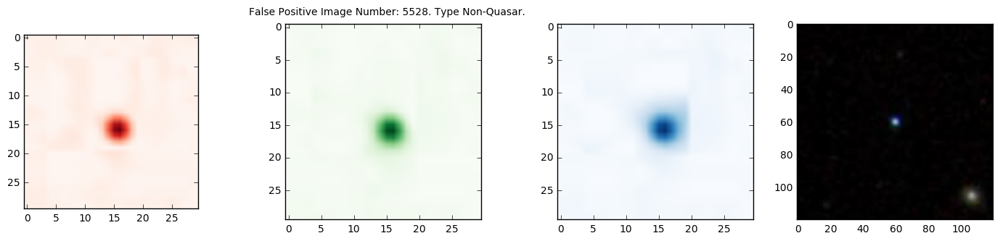

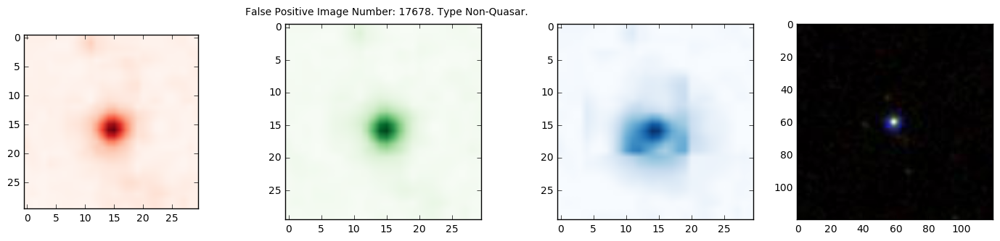

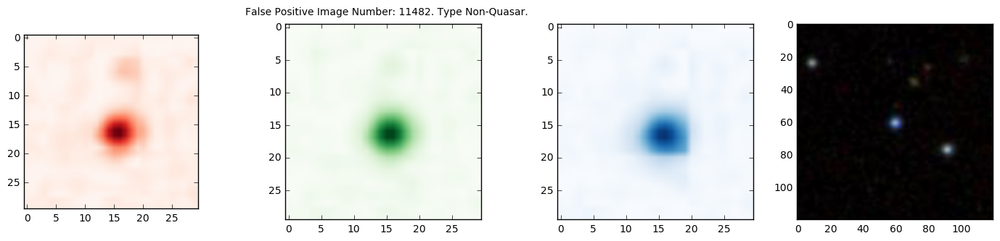

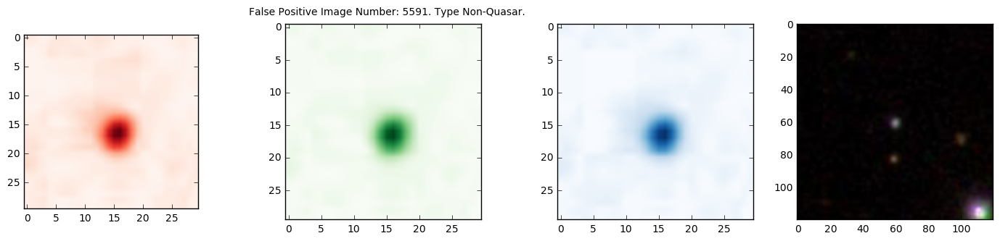

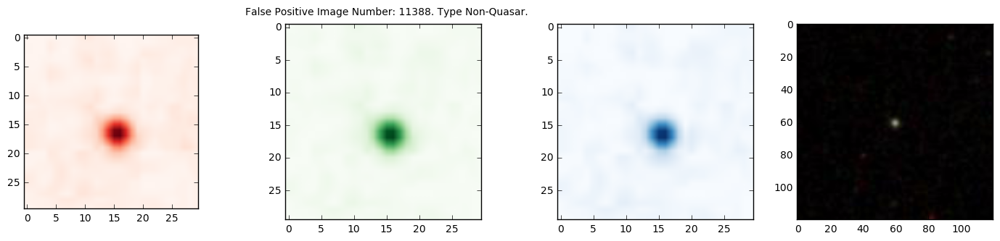

...

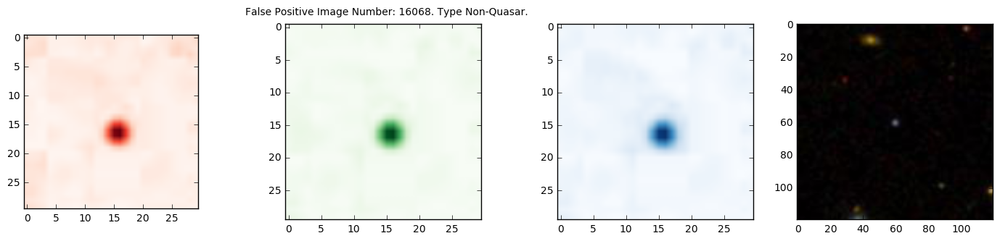

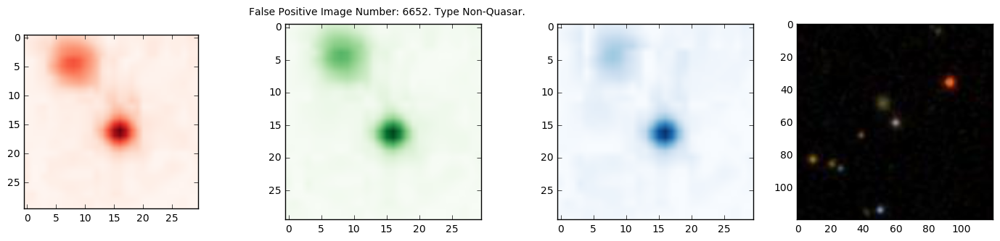

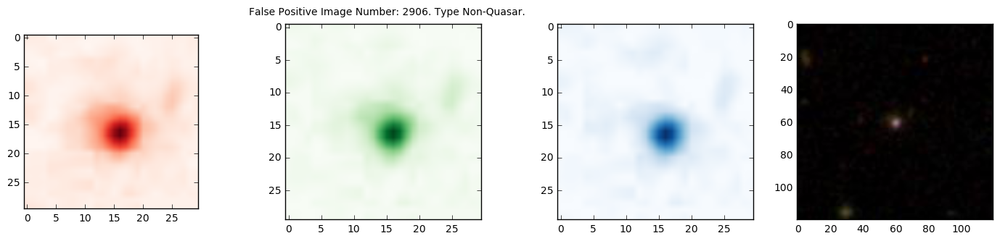

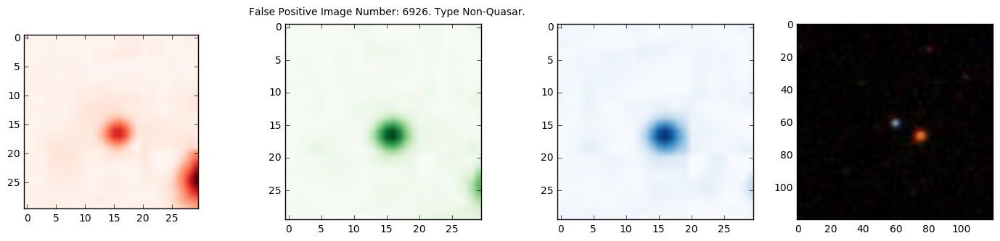

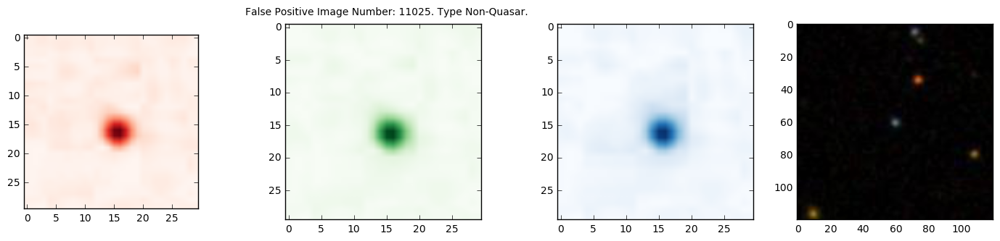

In [ ]:
# Previewing the false positives
false_pos_sample = false_positives.sample(20)
for ind in false_pos_sample.index:
    imageplot = plt.figure(figsize=(10, 3))
    axis1 = imageplot.add_axes([0, 0, .24, .9])
    axis1.imshow(valid_images[ind, :, :, 0], cmap='Reds')
    axis2 = imageplot.add_axes([.25, 0, .49, .9])
    axis2.imshow(valid_images[ind, :, :, 1], cmap='Greens')
    axis3 = imageplot.add_axes([.50, 0, .74, .9])
    axis3.imshow(valid_images[ind, :, :, 2], cmap='Blues')
    axis4 = imageplot.add_axes([.75, 0, .9, .9])
    current_img = false_positives.loc[ind]['FileName']
    axis4.imshow(Image.open('./Images/' + current_img))
    if false_positives.loc[ind]['Quasar'] == False:
        name = 'Non-Quasar'
    else:
        name = 'Quasar - ERROR'
    imageplot.suptitle(
        'False Positive Image Number: %s. Type %s.' % (str(ind), name))

We now consider the Quasar false negatives.

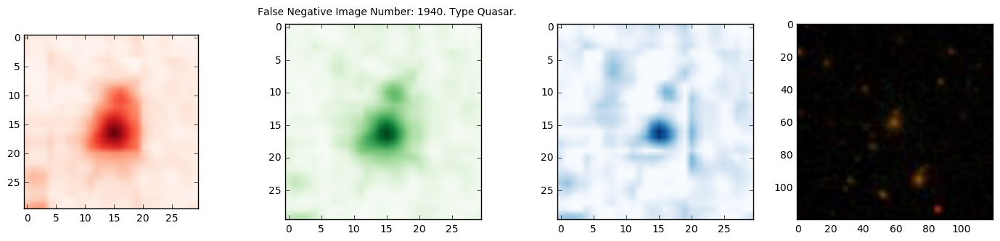

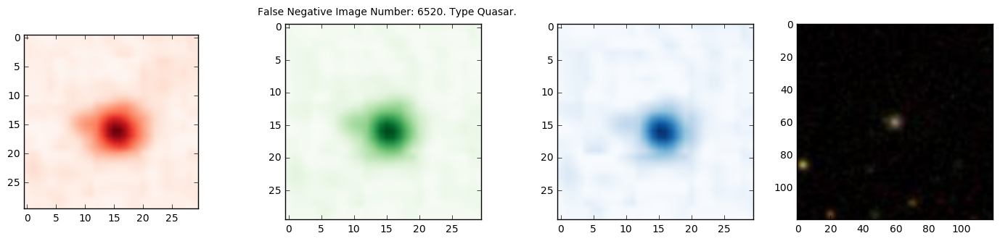

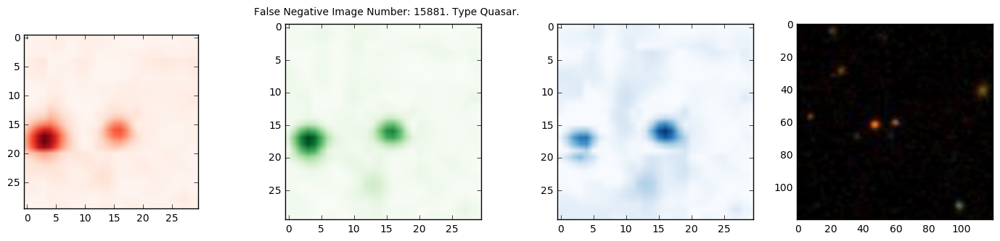

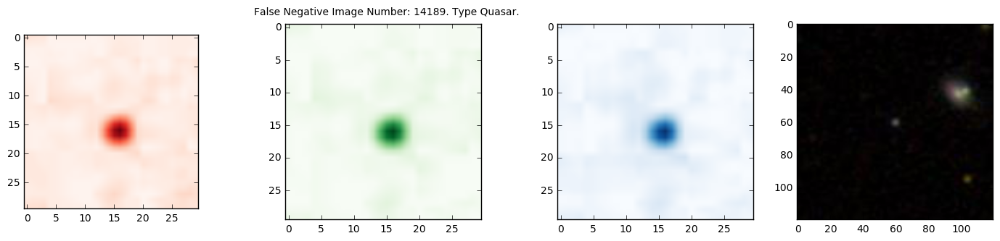

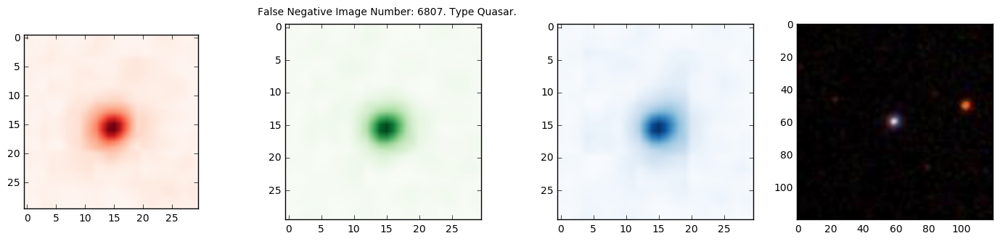

...

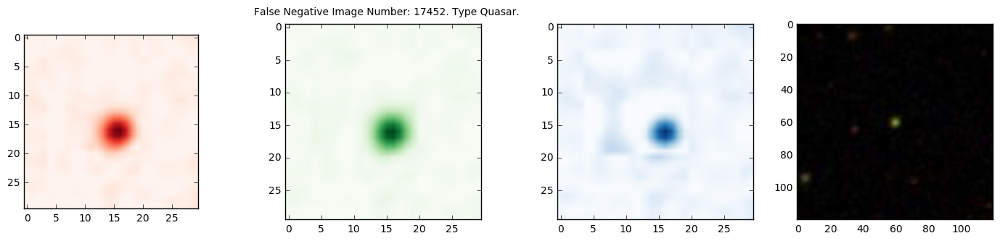

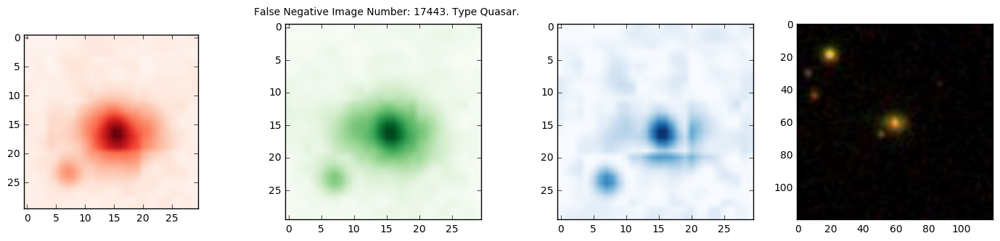

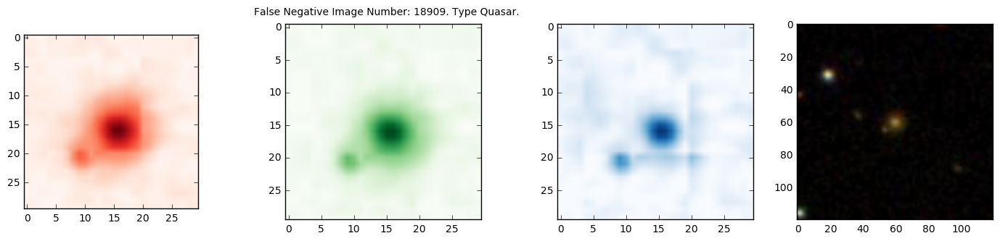

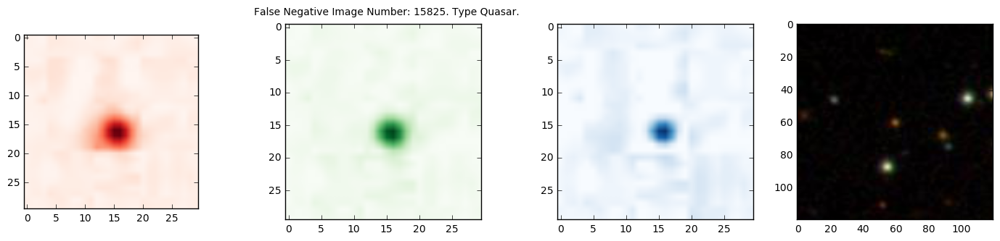

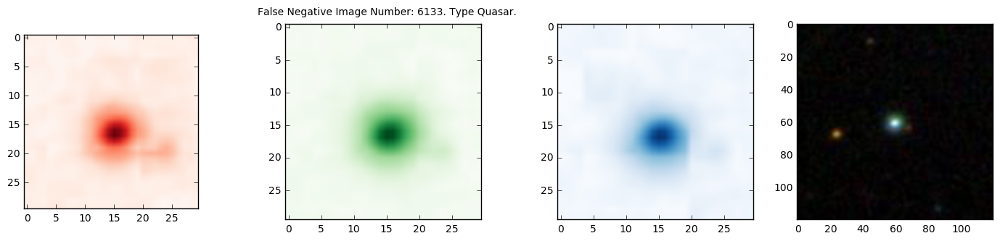

In [ ]:
# Previewing the false negatives
false_neg_sample = false_negatives.sample(20)
for ind in false_neg_sample.index:
    imageplot = plt.figure(figsize=(10, 3))
    axis1 = imageplot.add_axes([0, 0, .24, .9])
    axis1.imshow(valid_images[ind, :, :, 0], cmap='Reds')
    axis2 = imageplot.add_axes([.25, 0, .49, .9])
    axis2.imshow(valid_images[ind, :, :, 1], cmap='Greens')
    axis3 = imageplot.add_axes([.50, 0, .74, .9])
    axis3.imshow(valid_images[ind, :, :, 2], cmap='Blues')
    axis4 = imageplot.add_axes([.75, 0, .9, .9])
    current_img = false_negatives.loc[ind]['FileName']
    axis4.imshow(Image.open('./Images/' + current_img))
    if false_negatives.loc[ind]['Quasar'] == True:
        name = 'Quasar'
    else:
        name = 'Non-Quasar - ERROR'
    imageplot.suptitle(
        'False Negative Image Number: %s. Type %s.' % (str(ind), name))

Finally, we will report the testing accuracy of this model.

In [ ]:
# Due to memory issues, we will run our testing images through the Inception ConvNet in batches
test_batch = []
step_size = 2117
for i in range(10):
    test_batch.append(test_images[i * step_size:(i + 1) * step_size, :, :, :])
del test_images

In [ ]:
with tf.Session(graph=tunedinceptiongraph) as session:

    def testing():
        test_predictions = []
        for i in range(len(test_batch) - 1):
            test_predictions.append(test_normal_prediction.eval(
                feed_dict={test_batch_normal: test_batch[i]}))
        test_predictions.append(test_small_prediction.eval(
            feed_dict={test_batch_small: test_batch[9]}))
        return np.concatenate(tuple([pred for pred in test_predictions]), axis=0)

    saver.restore(session, "./InceptionConvNet.ckpt")
    print("InceptionConvNet restored.")
    TestPredictions = testing()
    print('Testing Accuracy: %.1f%%' % accuracy(
        TestPredictions, test_dataframe[['EncodedQuasar', 'EncodedNonQuasar']].values))

InceptionConvNet restored.
Testing Accuracy: 96.6%


In [ ]:
TestPredictions = 1 - np.argmax(TestPredictions, axis=1)
TrueTest = 1 - \
    np.argmax(
        test_dataframe[['EncodedQuasar', 'EncodedNonQuasar']].values, axis=1)

In [ ]:
print('Confusion Matrix: (note that Non-quasar is first row and column)')
print(metrics.confusion_matrix(TrueTest, TestPredictions))
print('\n')
print('Classification Report:')
print(metrics.classification_report(TrueTest, TestPredictions))

Confusion Matrix: (note that Non-quasar is first row and column)
[[13783   524]
 [  201  6656]]


Classification Report:
             precision    recall  f1-score   support

          0       0.99      0.96      0.97     14307
          1       0.93      0.97      0.95      6857

avg / total       0.97      0.97      0.97     21164

